<a href="https://colab.research.google.com/github/nixonleonard/UTS-UAS-ML/blob/main/UAS_3_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Importing Library

In [ ]:
import pandas as pd
import numpy as np
from numpy import log,dot,exp,shape
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mode
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report

#Importing Datasets

In [ ]:
data = pd.read_csv('experiment.csv')
data.head()

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,...,F192,F193,F194,F195,F196,F197,F198,F199,F200,Class
0,0.006711,0.0,0.013423,0.006711,0.0,0.006711,0.006711,0.020134,0.020134,0.000000,...,0.013423,0.000000,0.006711,0.013423,0.020134,0.006711,0.0,0.006711,0.0,1
1,0.000000,0.0,0.000000,0.007246,0.0,0.000000,0.000000,0.021739,0.014493,0.000000,...,0.007246,0.007246,0.000000,0.000000,0.014493,0.000000,0.0,0.007246,0.0,1
2,0.011696,0.0,0.005848,0.000000,0.0,0.005848,0.000000,0.035088,0.017544,0.017544,...,0.005848,0.000000,0.005848,0.011696,0.035088,0.005848,0.0,0.000000,0.0,1
3,0.000000,0.0,0.020833,0.000000,0.0,0.000000,0.010417,0.000000,0.020833,0.000000,...,0.010417,0.000000,0.000000,0.041667,0.000000,0.000000,0.0,0.000000,0.0,1
4,0.000000,0.0,0.034483,0.000000,0.0,0.000000,0.000000,0.000000,0.034483,0.000000,...,0.017241,0.000000,0.000000,0.068966,0.000000,0.000000,0.0,0.000000,0.0,1


#Visualizing Data

Pada tahap berikut, saya ingin menapilkan dan mengetahui apakah terdapat missing value atau tidak agar nantinya bisa lebih mudah untuk preprocess

In [ ]:
print(data.isnull().sum())

F1       0
F2       0
F3       0
F4       0
F5       0
        ..
F197     0
F198     0
F199     0
F200     0
Class    0
Length: 201, dtype: int64


Diatas menunjukan bahwa ternyata tidak ada data missing value

##Visualize with Box Plot

Visualisasi data, pertama saya menggunakan box plot, dengan boxplot ini membantu kita dalam memahami karakteristik dari distribusi data, derajat dan kesimetrisan penyebaran data

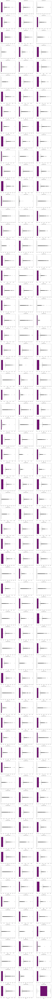

In [ ]:
plt.figure(figsize=(20,400))
for i, col in zip(range(1, 202), data.columns):
    plt.subplot(67, 3, i)
    sns.boxplot(x=col, data=data, color='purple')
    plt.title(f"Box Plot of {col}")
plt.show()

Bisa kita lihat dari boxplot tiap atribut diatas, kurang lebih penyebaran datanya sudah lumayan mirip dan sama, dan juga terdapat outliers juga tiap atribut. Paling bawah juga terdapat atribut target 'Class'

##Visualize with Histogram or Hist Plot

Visualisasi data, kedua saya menggunakan histogram, dengan histogram ini membantu kita dalam mengetahui variasi datanya dan membantu menentukan keputusan dalam menggunakan data tersebut

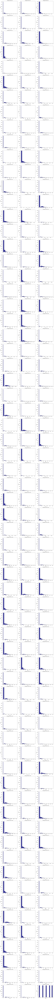

In [ ]:
plt.figure(figsize=(20,400))
for i, col in zip(range(1, 202), data.columns):
    plt.subplot(67, 3, i)
    sns.histplot(x=col, data=data, color='navy')
    plt.title(f"Histogram Plot of {col}")
plt.show()

Bisa dilihat dari histogram diatas, data yang kita punya tidak begitu banyak jumlah dari variasi data, bentuk histogram tiap atribut mirip mirip dan lainnya.

##Visualize with Correlation Matrix

Dengan menggunakan correlation matrix ini, kita bisa melihat korelasi tiap atribut, terutama atribut independent dengan target.

In [ ]:
a = data.corr().abs()

plt.figure(figsize=(300, 300))
sns.heatmap(a, annot=True, linewidths=0.5,).set_title('Correlation Matrix')

plt.show()

Dari correlation matrix diatas, bisa dilihat (bisa di klik sekali pada gambarnya untuk zoom) bahwa kebanyakan korelasi atribut independent dengan class rata rata dibawah 0.1. Maka dari hal tersebut, saya memutuskan untuk mengambil korelasi terbesar aja, atau diatas 0.1.

In [ ]:
corrAttWClass = a['Class']
idx = []
core = []

print(f'Correlation between each attribute with Class\n')
for i in range(len(corrAttWClass)):
    if corrAttWClass[i] > 0.1:
        core.append(corrAttWClass[i])
        idx.append(i+1)
        # print(f'F{i+1} {corrAttWClass[i]}')
        
df = pd.DataFrame({
    'F' : idx,
    'Correlation' : core
})
df

Correlation between each attribute with Class



,F,Correlation
0,4,0.111382
1,6,0.121490
2,12,0.164925
3,13,0.160201
4,15,0.152490
5,16,0.150963
6,24,0.100613
7,34,0.100133
8,57,0.109246
9,60,0.111672


Diatas ini bisa kita lihat terdapat 29 atribut (selain 'Class') yang memiliki korelasi diatas 0.1 dengan target('Class'), dan saya tampilkan seperti diatas.

#Preprocessing Data

##Selection / Dimenssion Reduction

Menggunakan atribut yang memiliki korelasi diatas 0.1 yang sudah ditampilkan sebelumnya. 

In [ ]:
X = data[['F4','F6','F12','F13','F15','F16','F24','F34','F57','F60','F65','F66','F80','F102','F108','F114','F122','F126','F127','F151','F157','F163','F164','F168','F175','F189','F196','F197','F200']]
y = data['Class']

Disini alasan saya melakukan selection yaitu untuk mengurangi atribut atau data data yang memiliki pengaruh atau korelasi yang rendah dengan target agar dapat mempercepat train dan testing nantinya atau tidak memperlambat model dalam membaca data nantinya

In [ ]:
X = np.array(X)
y = np.array(y)

##Normalisasi

In [ ]:
scaler = StandardScaler()
X = scaler.fit_transform(X)

Disini alasan saya melakukan normalisasi untuk menghilangkan dan mengurangi redudansi data dan memastikan dependensi data

##Train Test Split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

Disini dilakukan spliting untuk training dan testing data, 75% untuk training dan 25% untuk testing

#Machine Learning Modeling Method

Metode ML yang saya gunakan KNN dengan MLR, karena disini saya mau membandingkan model yang efektif untuk data besar dengan metode yang paling sederhana yang lumayan cepat dan banyak digunakan saat pertamakali belajar machine learning (Performance vs Speed/Simple), dimana untuk membandingkan juga bahwa KNN memiliki performa yang lebih baik untuk menghandle dataset yang diberikan dibanding yang lainnya.

##K-Nearest Neighbour Model with Euclidean Disntance

Alasan menggunakan KNN yaitu 

1.   Pertama, algoritma KNN kuat dalam mentraining data yang noisy atau memilki banyak outlier yang dimana data kita ini memiliki banyak outlier dari yang sudah ditampilkan diatas 
2.   Kedua, algoritma KNN sangat efektif jika datanya besar, dimana data kita memiliki jumlah atribut sebanya 200, dan setelah di selection, memiliki 29 atribut
3.  Ketiga, algoritma KNN ini mudah diimplementasikan


###KNN Model

In [ ]:
def euclidean(p1, p2):
    return np.sqrt(np.sum((p1 - p2)**2))

In [ ]:
def predict(X_train, X_test, y_train, k):
    prediction = []
    for x1 in X_test:
        dist = []
        for x2 in X_train:
            dist.append(euclidean(x1, x2))
        dist = np.array(dist)
        k_best = np.argsort(dist)[:k]
        labels = y_train[k_best]
        prediction.append(mode(labels).mode[0])

    return prediction

In [ ]:
def calculate_rmse(y_test, y_pred):
	error = 0.0
	for i in range(len(y_test)):
		predError = y_pred[i] - y_test[i]
		error += (predError ** 2)
	meanError = error / float(len(y_test))
	return np.sqrt(meanError)

In [ ]:
def calculate_accuracy(y_test, y_pred):
	facc = 0
	for i in range(len(y_test)):
		if y_test[i] == y_pred[i]:
			facc += 1
	return facc / float(len(y_test)) * 100.0

Text(0, 0.5, 'Accuracy')

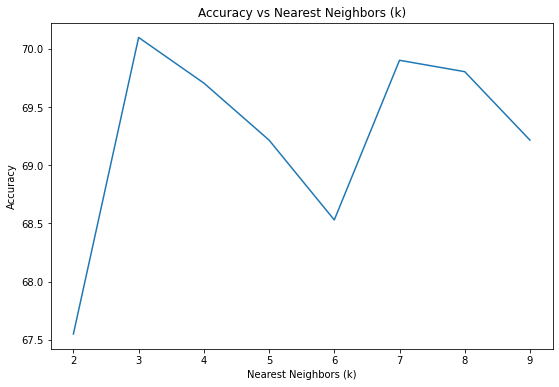

In [ ]:
euclidean_acc = []
max_acc = 0

for k in range(2,10):
    y_pred_knn = predict(X_train, X_test, y_train, k)
    euclidean_acc.append(calculate_accuracy(y_test, y_pred_knn))
    if max_acc <= calculate_accuracy(y_test, y_pred_knn):
        max_acc = calculate_accuracy(y_test, y_pred_knn)

fig, ax = plt.subplots(figsize=(9,6))
ax.plot(range(2,10), euclidean_acc)
plt.title('Accuracy vs Nearest Neighbors (k)')
ax.set_xlabel('Nearest Neighbors (k)')
ax.set_ylabel('Accuracy')

In [ ]:
all_k_m = []
index = 1
for i in euclidean_acc:
    index = index+1
    if i == max_acc :
        all_k_m.append(index)

print('Akurasi terbesar terdapat pada k : ' + str(all_k_m) + ' dengan akurasi ' + str(max_acc) + ' %')

Akurasi terbesar terdapat pada k : [3] dengan akurasi 70.09803921568627 %


Dari hasil yang sudah kita jalankan, didapat bahwa akurasi terbesar dari model KNN ini yaitu sebesar 70.098% dengan K = 3

##Multivariate Linier Regression Model

Alasan menggunakan MLR yaitu 

1.   Pertama, algoritma MLR berkinerja sangat baik untuk data yang dapat dipisahkan secara linier
2. Kedua, algoritma MLR ini paling sederhana atau dasar, lebih mudah diimplementasikan, diinterpretasikan, dan efisien untuk dilatih, serta lumayan cepat
3. Ketiga, algoritma MLR Ini menangani overfitting dengan cukup baik menggunakan teknik pengurangan dimensi (sesuai dengan preprocessing diatas), regularisasi, dan validasi silang

###MLR Model with gradient descent

In [ ]:
def prediction(w,X,b):                          
    predList=[]
    for i in range(len(X)):
        predList.append(w@X[i]+b)
    return np.array(predList)

def linLost(y,predY):                             
    s=0
    for i in range(len(y)):
        s+=(y[i]-predY[i])**2
    return (1/len(y))*s

def derLostW(X,y,predY):                    
    s=0
    n=len(y)
    for i in range(n):
        s+=-X[i]*(y[i]-predY[i])
    return (2/n)*s
    
def derLostB(y,predY):                   
    s=0
    for i in range(len(y)):
        s+=-(y[i]-predY[i])
    return (2/len(y)) * s
        
def gradientDescent(X,y):              
    wVector=np.random.randn(X.shape[1])        
    b=0                                                               
    epoch = 2000
    n = len(X)
    linLostList=[]                                                       
    learningRate = 0.001

    for i in range(epoch):
        predY = prediction(wVector,X,b)
        wVector = wVector - learningRate *derLostW(X,y,predY) 
        b = b - learningRate * derLostB(y,predY)
        linLostList.append(linLost(y,predY))
        
    plt.plot(np.arange(1,epoch),linLostList[1:])
    plt.xlabel("epoch number")
    plt.ylabel("the linier loss")
    
    return wVector,b

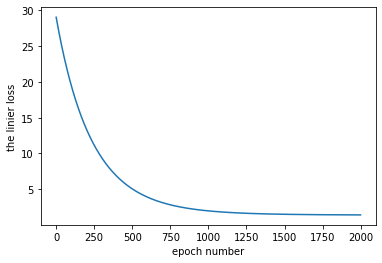

In [ ]:
weight, bias = gradientDescent(X_train, y_train)

In [ ]:
def predictionVar(X):
  return bias + np.dot(X, weight)

y_pred_lr= predictionVar(X_test)

printCompare = pd.DataFrame({
    'y_pred_lr': y_pred_lr,
    'test_y': y_test
})

printCompare.head(10)

,y_pred_lr,test_y
0,2.739134,1
1,4.325498,5
2,2.976785,2
3,3.494846,4
4,3.094079,1
5,2.717435,2
6,3.130235,2
7,1.468840,5
8,3.651844,5
9,2.912677,3


diatas ini saya menampilkan beberapa komparasi antara ground thruth dengan prediksi

In [ ]:
acc_lr = r2_score(y_test,y_pred_lr)
acc_lr

0.30189840463300854

Dari hasil yang sudah kita jalankan, didapat bahwa akurasi terbesar dari model MLR ini yaitu sebesar 30.1898% dimana akurasi tersebut kurang baik

#Evaluation

###Metric Evaluation for KNN

Berikut untuk metric evaluation pada KNN yaitu dengan menampilkan confusion matrix

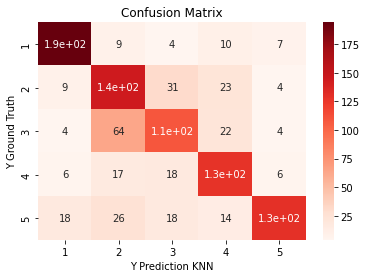

In [ ]:
cf_matrix = confusion_matrix(y_test, y_pred_knn)

ax = sns.heatmap(cf_matrix, annot=True, cmap='Reds')

ax.set_title('Confusion Matrix');
ax.set_xlabel('Y Prediction KNN')
ax.set_ylabel('Y Ground Truth');

ax.xaxis.set_ticklabels(['1','2','3','4','5'])
ax.yaxis.set_ticklabels(['1','2','3','4','5'])

plt.show()

Untuk metric evaluation kedua pada KNN yaitu dengan menampilkan classification report, untuk mendapatkan Precision, Recall, F1-score, support, dan lainnya

In [ ]:
print(classification_report(y_test, y_pred_knn))

              precision    recall  f1-score   support

           1       0.84      0.87      0.85       224
           2       0.56      0.68      0.61       212
           3       0.61      0.54      0.57       203
           4       0.65      0.73      0.69       175
           5       0.86      0.63      0.73       206

    accuracy                           0.69      1020
   macro avg       0.70      0.69      0.69      1020
weighted avg       0.71      0.69      0.69      1020



###Metric Evaluation for Multivariate Linier Regression

Untuk metric evaluation pada MLR, saya akan menampilkan MSE, RMSE, MAE, serta R2Score dari prediksi diatas

In [ ]:
mse = mean_squared_error(y_test, y_pred_lr)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_lr)
acc = r2_score(y_test, y_pred_lr)

In [ ]:
print(f'MSE of Multivariate Linier Regression Model : {mse}')
print(f'EMSE of Multivariate Linier Regression Model : {rmse}')
print(f'MAE of Multivariate Linier Regression Model : {mae}')
print(f'Accuracy of Multivariate Linier Regression Model : {acc*100} %')

MSE of Multivariate Linier Regression Model : 1.438483159616787
EMSE of Multivariate Linier Regression Model : 1.1993678166504165
MAE of Multivariate Linier Regression Model : 0.9960556962254141
Accuracy of Multivariate Linier Regression Model : 30.189840463300854 %


###Model Comparisson (Accuracy)

Akhirnya, dapat dilihat dari perbandingan dibawah ini, dimana Akurasi dari KNN model lebih baik dibandingkan akurasi dari MLR Model, dapat dibilang juga melihat performance pastinya lebih akurat daripada melihat speed saja.

In [ ]:
print('Accuracy Score Comparisson')
print(f'Accuracy of KNN Model : {max_acc} % dengan k = 3')
print(f'Accuracy of MLR Model : {acc*100} %')

Accuracy Score Comparisson
Accuracy of KNN Model : 70.09803921568627 % dengan k = 3
Accuracy of MLR Model : 30.189840463300854 %


#Extra (Library model)

Disini saya hanya membandingkan akurasi saja pak, hanya ingin tahu ..  **bukan untuk dinilai** *

Akurasi terbesar masih dipegang oleh KNN dari data diatas

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression

In [ ]:
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.5411764705882353

In [ ]:
reg = LinearRegression().fit(X_train, y_train)
y_pred = reg.predict(X_test)

In [ ]:
r2_score(y_test,y_pred)

0.30993817402297075

In [ ]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.7009803921568627

In [ ]:
clf = DecisionTreeClassifier()
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.6049019607843137

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=42)
y_pred = kmeans.fit_predict(X_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.05588235294117647

In [ ]:
logreg = LogisticRegression()
logreg.fit(X_train,y_train)
y_pred=logreg.predict(X_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.6009803921568627